In [1]:
import rasterio as rio
from rasterio.plot import show
import geopandas as gpd
from glob import glob
import numpy as np
import matplotlib.pyplot as plt
import folium
import os, sys
import fnmatch
from TOA_Reflectance_Stacker import histogram_stretch
from tqdm import tqdm
import earthpy.plot as ep
import shapely
from sklearn import cluster
from rasterio.plot import reshape_as_image
import matplotlib.patches as mpatches
from datetime import datetime
from matplotlib.colors import ListedColormap
import pandas as pd
from landsat_processing_utils import histogram_stretch

In [20]:
import earthpy.plot as ep
import rioxarray as rxr

with rio.open("data/LC08_L1TP_113037_20230502_20230509_02_T1_TOA_STACKED_CROPPED.tif") as ds:
    data = ds.read()
    profile = ds.profile
    ds.close()

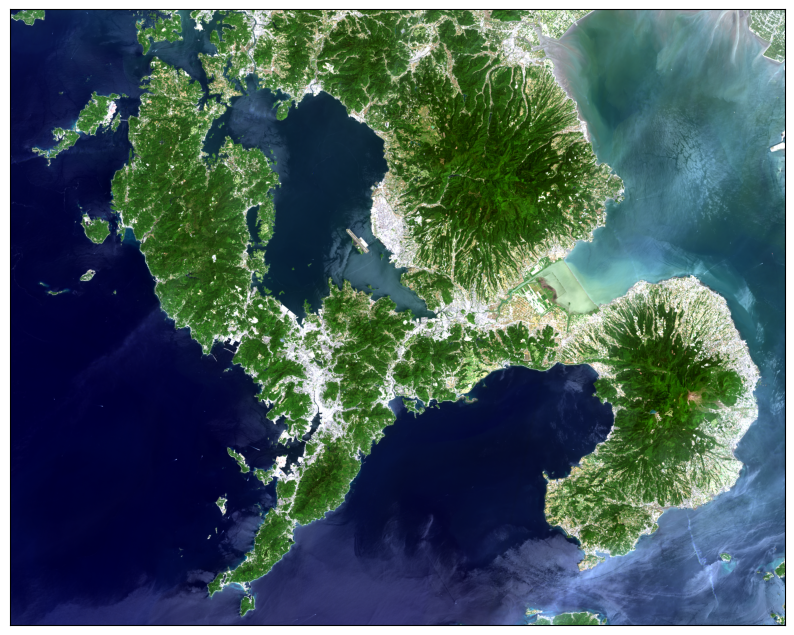

In [21]:
ep.plot_rgb(data, rgb = (3,2,1), stretch = True);

In [3]:
# grab 'ground truth' data from maps
# want to try and get the most amount of variation in a single land-use type

land_use = gpd.read_file("land_use_training_set_20210325.geojson")
land_use = land_use.to_crs('EPSG:3098')
print(land_use.crs)

print(land_use.LULC.unique())

EPSG:3098
['Forest' 'Water' 'Urban' 'Bare Land' 'Cropland']


<Axes: >

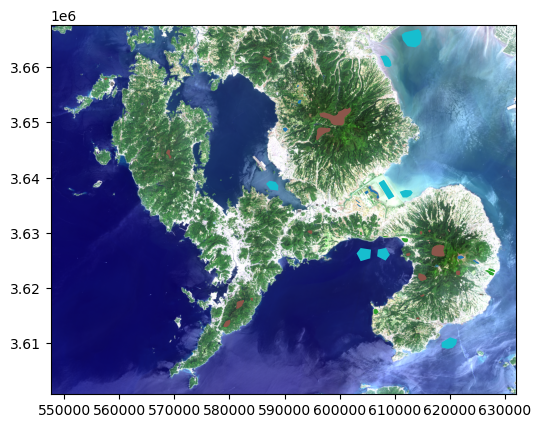

In [34]:
f, ax = plt.subplots()

show(histogram_stretch(data[[3,2,1]], min_vals = 0, max_vals = 95), transform = profile["transform"], ax = ax)
land_use.plot(ax = ax, column = "LULC")

In [39]:
# Our data object currently contains bands 1-7 and 9,10,11.
# Let's get rid of bands and add NDVI, MNDWI, NDBI, and BSI

data_sel = data[:7, ...]

In [46]:
# Define normalized_difference function
def normalized_diff(b1, b2):
    return (b1 - b2) / (b1 + b2)

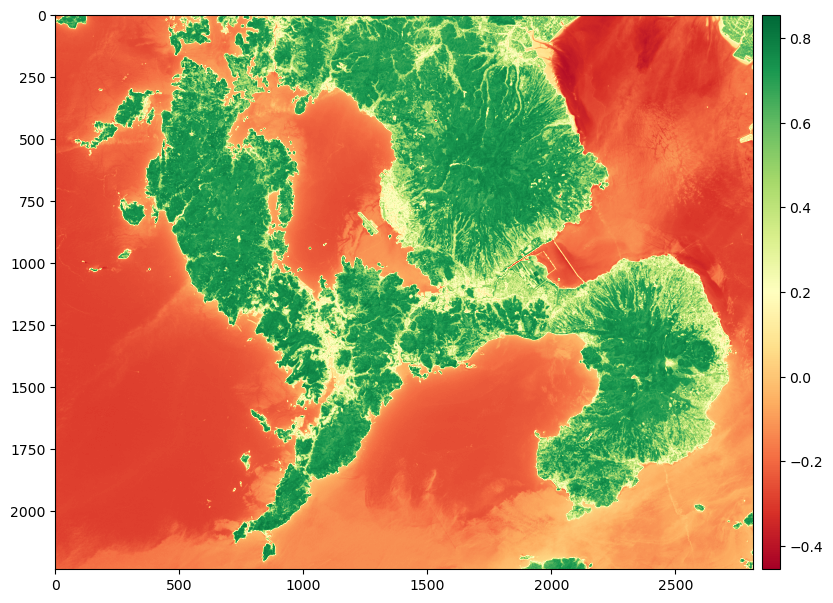

In [49]:
ndvi = normalized_diff(data_sel[4], data_sel[3])

# Setup figure and axis
f, ax = plt.subplots(1, figsize=(9, 9))

# Add hexagon layer that displays count of points in each polygon
# Note that we aren't using any polygons/points for this - it is observations per hex based on the long/lat columns
# These can be easily extracted from shapely points
# Also note that this way we don't lose the boat people
hb = ax.imshow(
    ndvi, cmap = "RdYlGn"
)

# Add a colorbar (optional)
# Add a colorbar: special code to get the color to fit the axes properly
cax = f.add_axes([ax.get_position().x1+0.01,ax.get_position().y0,0.02,ax.get_position().height])

f.colorbar(hb, cax=cax)

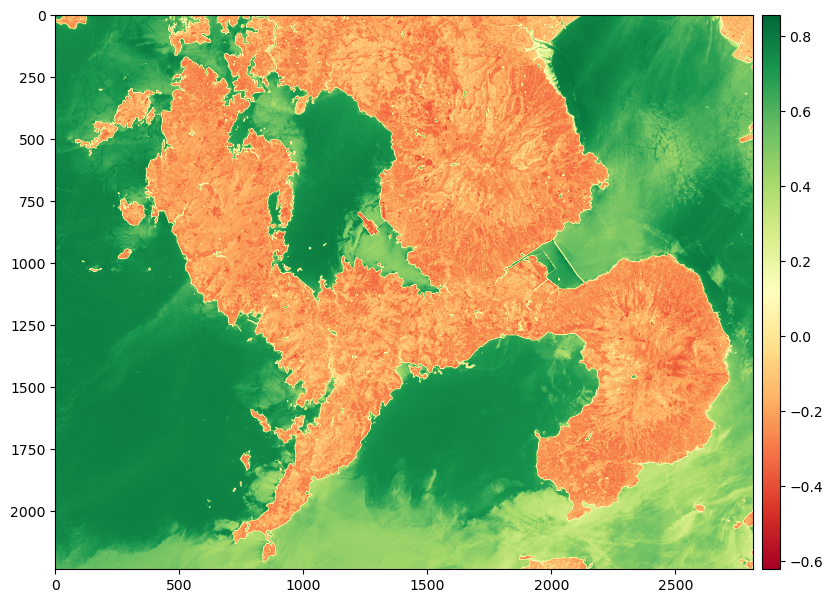

In [51]:
mndwi = normalized_diff(data_sel[2], data_sel[5])

# Setup figure and axis
f, ax = plt.subplots(1, figsize=(9, 9))

# Add hexagon layer that displays count of points in each polygon
# Note that we aren't using any polygons/points for this - it is observations per hex based on the long/lat columns
# These can be easily extracted from shapely points
# Also note that this way we don't lose the boat people
hb = ax.imshow(
    mndwi, cmap = "RdYlGn"
)

# Add a colorbar (optional)
# Add a colorbar: special code to get the color to fit the axes properly
cax = f.add_axes([ax.get_position().x1+0.01,ax.get_position().y0,0.02,ax.get_position().height])

f.colorbar(hb, cax=cax)

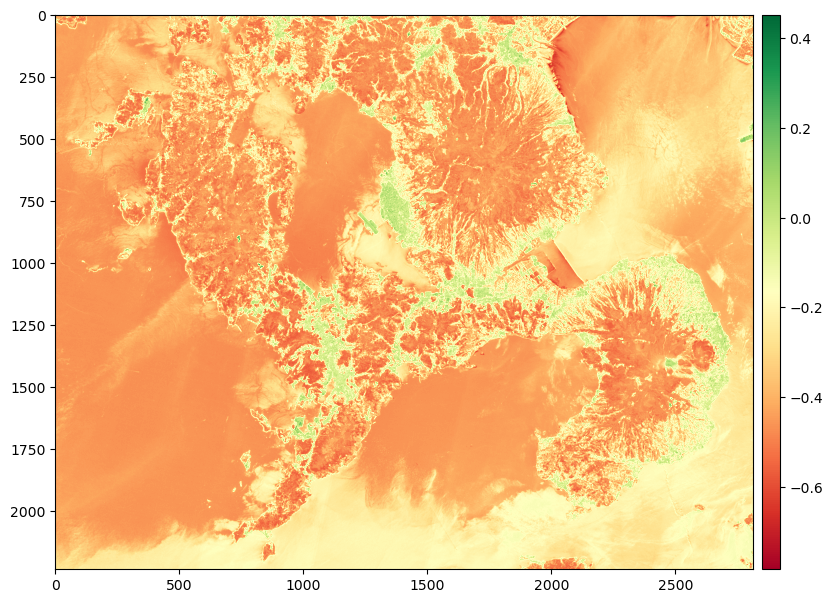

In [52]:
ndbi = normalized_diff(data_sel[5], data_sel[4])

# Setup figure and axis
f, ax = plt.subplots(1, figsize=(9, 9))

# Add hexagon layer that displays count of points in each polygon
# Note that we aren't using any polygons/points for this - it is observations per hex based on the long/lat columns
# These can be easily extracted from shapely points
# Also note that this way we don't lose the boat people
hb = ax.imshow(
    ndbi, cmap = "RdYlGn"
)

# Add a colorbar (optional)
# Add a colorbar: special code to get the color to fit the axes properly
cax = f.add_axes([ax.get_position().x1+0.01,ax.get_position().y0,0.02,ax.get_position().height])

f.colorbar(hb, cax=cax)

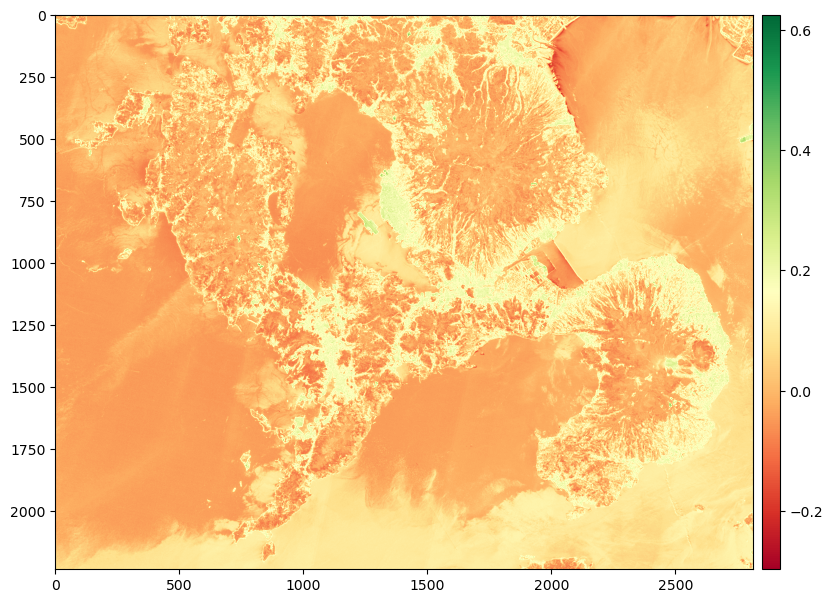

In [60]:
mbi = 0.5 + ((data_sel[5] - data_sel[6] - data_sel[4]) / (data_sel[5] + data_sel[6] + data_sel[4]))
# bsi = (data_sel[3] + data_sel[1] - data_sel[2]) / (data_sel[3] + data_sel[2] + data_sel[1])

# Setup figure and axis
f, ax = plt.subplots(1, figsize=(9, 9))

# Add hexagon layer that displays count of points in each polygon
# Note that we aren't using any polygons/points for this - it is observations per hex based on the long/lat columns
# These can be easily extracted from shapely points
# Also note that this way we don't lose the boat people
hb = ax.imshow(
    mbi, cmap = "RdYlGn"
)

# Add a colorbar (optional)
# Add a colorbar: special code to get the color to fit the axes properly
cax = f.add_axes([ax.get_position().x1+0.01,ax.get_position().y0,0.02,ax.get_position().height])

f.colorbar(hb, cax=cax)

In [69]:
# Create stack of bands 1-7 and the spectral indices
# Note that we need [..., np.newaxis] because the spectral indices are not 3D (yet)
stack = np.vstack([data_sel, ndvi[np.newaxis, ...], mndwi[np.newaxis, ...], ndbi[np.newaxis, ...], mbi[np.newaxis, ...]])

In [2]:
profile.update(count = 11)

# Need to save in order to grab data from land use polygons
with rio.open(
    "data/LC08_L1TP_113037_20230502_20230509_02_T1_INDICES.tif",
    "w",
    **profile
) as dst:
    dst.write(stack)
    dst.close()

NameError: name 'profile' is not defined

In [4]:
# To prep the data for ML analysis, we need two numpy arrays:
# X: a numpy array that contains all of the band data for the pixel
# y: the labels for training
X_train = np.array([], dtype = np.float32).reshape(0,11) # Create an array with 8 columns and 0 rows
                                                         # we're gonna stack new pixels inside
y_train = np.array([], dtype = np.string_)               # labels for training

# note that although we have scaled_stack, rio.mask.mask requires a dataset in read mode
with rio.open("data/LC08_L1TP_113037_20230502_20230509_02_T1_INDICES.tif") as src:
    profile = src.profile
    
    # Iterate over each polygon in our landuse ground truth dataset
    for index, row in land_use.iterrows():
        feature = [row["geometry"]]
        
        # crop the image - mask function returns a tuple
        out_image, out_transform = rio.mask.mask(src, feature, crop = True)

        # out_image has a shape (8, height, width)
        # Since this returns a rectangular array, and our shape is not rectangular, there will be
        # a bunch of nodata - get rid of them.
        
        # ~np.any(np.isnan(out_image), axis = 0) if any of the bands are np.nan
        
        # note that this gets rid of any column that has ANY nans
        # The following code returns a column for each band, with each row representing a pixel
        # If you use out_image == profile["nodata"], you MUST make sure that it is explicit
        # It will fail of profile["nodata"] is nan and not np.nan
        out_image_trimmed = out_image[:, ~np.any(np.isnan(out_image), axis = 0)]
        
        # We actually want this the other way around - we want a row for pixel, and a column for each
        # band - so we transpose the image
        out_image_trimmed = out_image_trimmed.T
        
#         # Comment these out if using TOA images
#         out_bands = out_image_trimmed[:,:-1] * 0.0000275 - 0.2
#         out_temp = out_image_trimmed[:,-1] * 0.00341802 + 149.0 
        
#         out_raster = np.hstack((out_bands, np.expand_dims(out_temp, axis = 1)))
        
        # We append the labels to the answer array equal to the number of pixels:
        # Remember to put brackets around the row["LULC"], or else you'll get "forestforestforest"
        # out_image_trimmed.shape[0] is the number of pixels in the training data
        y_train = np.append(y_train, [row["LULC"]] * out_image_trimmed.shape[0])
        
        # vstack is like concat for rows. Note that to vstack correctly, the array tuple that you feed
        # to vstack must have the same column dimension
        X_train = np.vstack((X_train, out_image_trimmed))

src.close()

In [5]:
# our X and y should have the same number of rows
print(X_train.shape)
print(y_train.shape)

(72049, 11)
(72049,)


In [6]:
# We can try other models and consider doing some hyperparameter tuning
from sklearn.ensemble import RandomForestClassifier
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler

# we use LinearSVC because SVC scales poorly with large numbers of samples
rf_pipeline = make_pipeline(
    StandardScaler(),
    RandomForestClassifier()
)

rf_pipeline

Pipeline(steps=[('standardscaler', StandardScaler()),
                ('randomforestclassifier', RandomForestClassifier())])

In [7]:
# We can try other models and consider doing some hyperparameter tuning
from sklearn.svm import LinearSVC

# we use LinearSVC because SVC scales poorly with large numbers of samples
svc_pipeline = make_pipeline(
    StandardScaler(),
    LinearSVC()
)

svc_pipeline

Pipeline(steps=[('standardscaler', StandardScaler()),
                ('linearsvc', LinearSVC())])

In [10]:
from sklearn.model_selection import GridSearchCV

# dictionary or list of dictionaries showing the hyperparameters to be tuned
# need to use the clf__ prefix to distinguish between multiple parts of the pipeline
# for example, if you are using PCA parameters or TDIFD vectorizers
parameter_grid = [
    {
        'linearsvc__penalty': ['l1'], 
        'linearsvc__C': [1, 10, 100, 1000]
    },
    {
        'linearsvc__penalty': ['l2'],
        'linearsvc__C': [1, 10, 100, 1000], 
        'linearsvc__loss': ['hinge', 'squared_hinge']
    }
]

# This does a random cross-validated search of the parameter grid
# if you don't specify cv, automatically uses cv = 5
# should actually use GridSearchCV for an exhaustive search of the grid
svc_search = GridSearchCV(
    estimator=svc_pipeline,
    param_grid=parameter_grid,
    n_jobs=-1,
    verbose=2,
    scoring = ('accuracy', 'f1_macro'), # list of scorers that the cv search should be scored by
    refit = 'f1_macro'                  # if using multiple scorers, sets which scorer should be used for best_params
)

svc_search

GridSearchCV(estimator=Pipeline(steps=[('standardscaler', StandardScaler()),
                                       ('linearsvc', LinearSVC())]),
             n_jobs=-1,
             param_grid=[{'linearsvc__C': [1, 10, 100, 1000],
                          'linearsvc__penalty': ['l1']},
                         {'linearsvc__C': [1, 10, 100, 1000],
                          'linearsvc__loss': ['hinge', 'squared_hinge'],
                          'linearsvc__penalty': ['l2']}],
             refit='f1_macro', scoring=('accuracy', 'f1_macro'), verbose=2)

In [11]:
%%time
# Takes around 3 mins
svc_search.fit(X_train, y_train)

Fitting 5 folds for each of 12 candidates, totalling 60 fits


C:\Users\tranq\anaconda3\envs\gdal\Lib\site-packages\sklearn\model_selection\_validation.py:425: FitFailedWarning: 
20 fits failed out of a total of 60.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
20 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\tranq\anaconda3\envs\gdal\Lib\site-packages\sklearn\model_selection\_validation.py", line 732, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\tranq\anaconda3\envs\gdal\Lib\site-packages\sklearn\base.py", line 1151, in wrapper
    return fit_method(estimator, *args, **kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\tranq\anaconda3\envs\gdal\Lib\site-packages\sklearn\pipeline.py", line 4

CPU times: total: 7.05 s
Wall time: 3min 44s


C:\Users\tranq\anaconda3\envs\gdal\Lib\site-packages\sklearn\svm\_base.py:1242: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


GridSearchCV(estimator=Pipeline(steps=[('standardscaler', StandardScaler()),
                                       ('linearsvc', LinearSVC())]),
             n_jobs=-1,
             param_grid=[{'linearsvc__C': [1, 10, 100, 1000],
                          'linearsvc__penalty': ['l1']},
                         {'linearsvc__C': [1, 10, 100, 1000],
                          'linearsvc__loss': ['hinge', 'squared_hinge'],
                          'linearsvc__penalty': ['l2']}],
             refit='f1_macro', scoring=('accuracy', 'f1_macro'), verbose=2)

In [13]:
# This allows you to create a dataframe of the scoring results
# it contains a list of all results for each split for all metrics given
svc_cv_results = pd.DataFrame.from_dict(svc_search.cv_results_, orient = "columns")

# We can see that teh best model had an accuracy of 96% and a mean f1 score of 0.82
svc_cv_results[["mean_test_accuracy", "mean_test_f1_macro", "rank_test_f1_macro"]]

,mean_test_accuracy,mean_test_f1_macro,rank_test_f1_macro
0,NaN,NaN,9
1,NaN,NaN,9
2,NaN,NaN,9
3,NaN,NaN,9
4,0.960749,0.814409,2
5,0.960485,0.813155,3
6,0.962054,0.815936,1
7,0.959916,0.809696,4
8,0.890353,0.720964,5
9,0.856765,0.713873,6


In [18]:
%%time

from sklearn.model_selection import RandomizedSearchCV

# dictionary or list of dictionaries showing the hyperparameters to be tuned
# need to use the clf__ prefix to distinguish between multiple parts of the pipeline
# for example, if you are using PCA parameters or TDIFD vectorizers
parameter_grid = {
    'randomforestclassifier__n_estimators': np.arange(10, 200, 10)
}

# This does a random cross-validated search of the parameter grid
# if you don't specify cv, automatically uses cv = 5
# should actually use GridSearchCV for an exhaustive search of the grid
rf_search = GridSearchCV(
    estimator=rf_pipeline,
    param_grid=parameter_grid,
    n_jobs=-1,
    verbose=2,
    scoring = ('accuracy', 'f1_macro'), # list of scorers that the cv search should be scored by
    refit = 'f1_macro'                  # if using multiple scorers, sets which scorer should be used for best_params
)

rf_search

CPU times: total: 0 ns
Wall time: 737 µs


GridSearchCV(estimator=Pipeline(steps=[('standardscaler', StandardScaler()),
                                       ('randomforestclassifier',
                                        RandomForestClassifier())]),
             n_jobs=-1,
             param_grid={'randomforestclassifier__n_estimators': array([ 10,  20,  30,  40,  50,  60,  70,  80,  90, 100, 110, 120, 130,
       140, 150, 160, 170, 180, 190])},
             refit='f1_macro', scoring=('accuracy', 'f1_macro'), verbose=2)

In [20]:
%%time
rf_search.fit(X_train, y_train)

Fitting 5 folds for each of 19 candidates, totalling 95 fits
CPU times: total: 20.1 s
Wall time: 10min 2s


GridSearchCV(estimator=Pipeline(steps=[('standardscaler', StandardScaler()),
                                       ('randomforestclassifier',
                                        RandomForestClassifier())]),
             n_jobs=-1,
             param_grid={'randomforestclassifier__n_estimators': array([ 10,  20,  30,  40,  50,  60,  70,  80,  90, 100, 110, 120, 130,
       140, 150, 160, 170, 180, 190])},
             refit='f1_macro', scoring=('accuracy', 'f1_macro'), verbose=2)

In [22]:
# This allows you to create a dataframe of the scoring results
# it contains a list of all results for each split for all metrics given
rf_cv_results = pd.DataFrame.from_dict(rf_search.cv_results_, orient = "columns")

# We can see that the best SVC model had an accuracy of 96% and a mean f1 score of 0.82
# While the best RF model had an accuracy of 93% and a mean f1 score of 0.84
rf_cv_results[["mean_test_accuracy", "mean_test_f1_macro", "rank_test_f1_macro"]]

,mean_test_accuracy,mean_test_f1_macro,rank_test_f1_macro
0,0.924413,0.814676,19
1,0.928216,0.831723,4
2,0.929562,0.817869,18
3,0.933323,0.832280,3
4,0.932144,0.824116,17
5,0.933823,0.825738,13
6,0.932768,0.837977,1
7,0.932963,0.825749,12
8,0.934309,0.825688,14
9,0.933476,0.826514,10


In [16]:
# Identify the best estimator for SVM
svc_search.best_estimator_

Pipeline(steps=[('standardscaler', StandardScaler()),
                ('linearsvc', LinearSVC(C=10, loss='hinge'))])

In [24]:
# Identify the best estimator for RF
rf_search.best_estimator_

Pipeline(steps=[('standardscaler', StandardScaler()),
                ('randomforestclassifier',
                 RandomForestClassifier(n_estimators=70))])

In [70]:
with rio.open("data/LC08_L1TP_113037_20230502_20230509_02_T1_INDICES.tif") as src:
    stack = src.read()
    profile = src.profile
    src.close()

In [71]:
# Reshape our image into rows of pixels and columns of bands
X_test = stack.swapaxes(0,2).reshape(-1, 11)

y_pred = svc_search.predict(X_test)

# Get back the original image
nagasaki_svc_pred = y_pred.reshape(stack.shape[2], stack.shape[1]).T

# nagasaki_pred currently a bunch of strings - convert to integers
lulc_dict = dict((
    ("Urban", 0),
    ("Cropland", 1),
    ("Forest", 2),
    ("Water", 3),
    ("Bare Land", 4),
))

# Invert dictionary
inv_dict = {v: k for k, v in lulc_dict.items()}

# replace all pixels with numbers

# apparently faster - returns unique values as well as the indices that can be used to reconstruct
# the array
u, inv = np.unique(nagasaki_svc_pred, return_inverse = True)
nagasaki_svc_pred = np.array([lulc_dict[x] for x in u])[inv].reshape(nagasaki_svc_pred.shape)

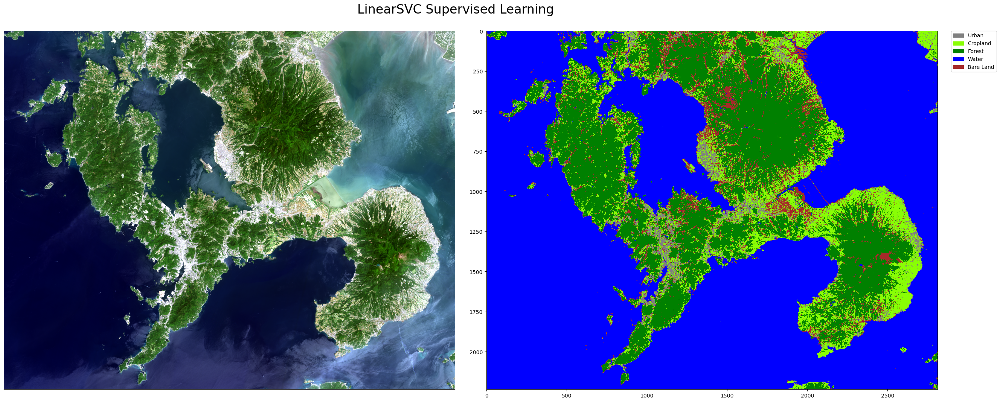

In [72]:
# the results are incredibly good!
fig, ax = plt.subplots(1,2,figsize = (32,18), gridspec_kw={'wspace': 0.07})

colors = ["grey", "xkcd:lime green", "green", "blue", "brown"]
cmap = ListedColormap(colors)

ep.plot_rgb(stack, rgb = (3,2,1), stretch = True, ax = ax[0])
# ax[0].imshow(reshape_as_image(histogram_stretch(stack[[3,2,1]])))
ax[1].imshow(nagasaki_svc_pred, cmap = cmap, interpolation='nearest')
# ax[1].imshow(cl_mask, alpha = 0.9 * cl_mask, cmap = "Greys_r")

fig.suptitle("LinearSVC Supervised Learning", y=.8, fontsize = 24)

patches = [mpatches.Patch(color=colors[i], label = inv_dict[i]) for i in range(len(np.unique(nagasaki_svc_pred))) ]
plt.legend(handles=patches, bbox_to_anchor=(1.03, 1), loc=2, borderaxespad=0. )

In [35]:
# Reshape our image into rows of pixels and columns of bands
X_test = stack.swapaxes(0,2).reshape(-1, 11)

# randomforest must slower than 
y_pred = rf_search.predict(X_test)

# Get back the original image
nagasaki_rf_pred = y_pred.reshape(stack.shape[2], stack.shape[1]).T

# nagasaki_pred currently a bunch of strings - convert to integers
lulc_dict = dict((
    ("Urban", 0),
    ("Cropland", 1),
    ("Forest", 2),
    ("Water", 3),
    ("Bare Land", 4),
))

# Invert dictionary
inv_dict = {v: k for k, v in lulc_dict.items()}

# replace all pixels with numbers

# apparently faster - returns unique values as well as the indices that can be used to reconstruct
# the array
u, inv = np.unique(nagasaki_rf_pred, return_inverse = True)
nagasaki_rf_pred = np.array([lulc_dict[x] for x in u])[inv].reshape(nagasaki_rf_pred.shape)

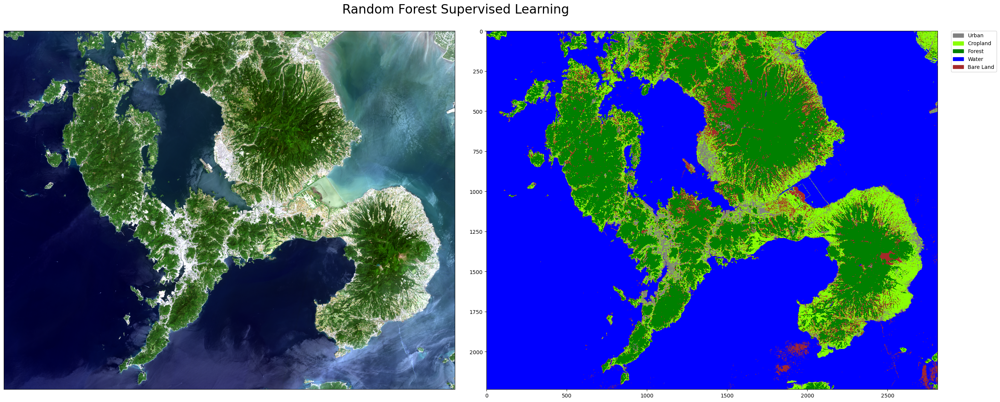

In [34]:
# the results are incredibly good!
fig, ax = plt.subplots(1,2,figsize = (32,18), gridspec_kw={'wspace': 0.07})

colors = ["grey", "xkcd:lime green", "green", "blue", "brown"]
cmap = ListedColormap(colors)

ep.plot_rgb(stack, rgb = (3,2,1), stretch = True, ax = ax[0])
# ax[0].imshow(reshape_as_image(histogram_stretch(stack[[3,2,1]])))
ax[1].imshow(nagasaki_rf_pred, cmap = cmap, interpolation='nearest')
# ax[1].imshow(cl_mask, alpha = 0.9 * cl_mask, cmap = "Greys_r")

fig.suptitle("Random Forest Supervised Learning", y=.8, fontsize = 24)

patches = [mpatches.Patch(color=colors[i], label = inv_dict[i]) for i in range(len(np.unique(nagasaki_rf_pred))) ]
plt.legend(handles=patches, bbox_to_anchor=(1.03, 1), loc=2, borderaxespad=0. )

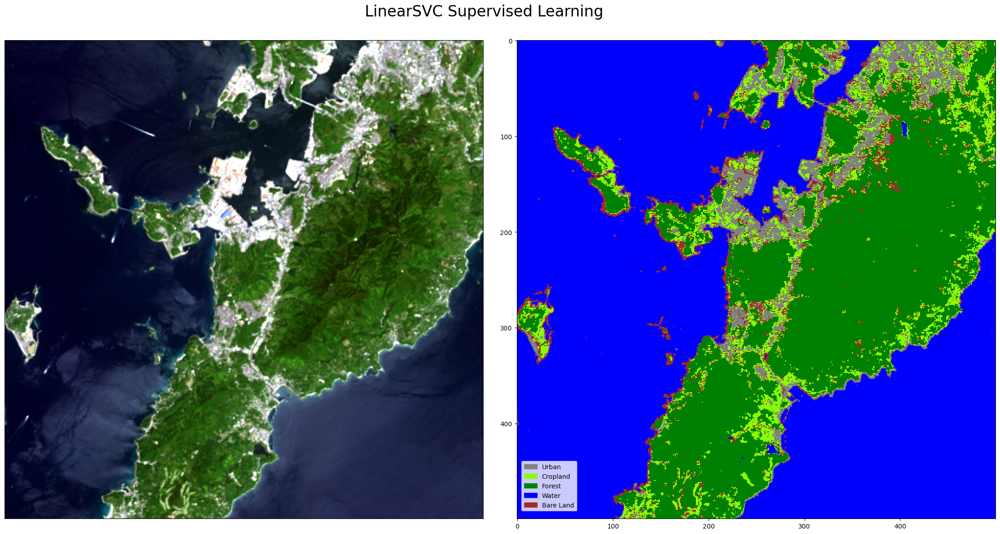

In [38]:
# the linearsvc does slightly worse at identifying beaches than the GNB, but otherwise is much better at distinguishing 
# between urban and bare land
fig, ax = plt.subplots(nrows = 1, ncols = 2,figsize = (28,18), gridspec_kw={'wspace': 0.07})

colors = ["grey", "xkcd:lime green", "green", "blue", "brown"]
cmap = ListedColormap(colors)

ep.plot_rgb(stack[:, 1500:2000, 750:1250], rgb = (3,2,1), stretch = True, ax = ax[0])
ax[1].imshow(nagasaki_svc_pred[1500:2000, 750:1250], cmap = cmap, interpolation='nearest')
# ax[1].imshow(cl_mask[1500:2000, 750:1250], alpha = 0.5 * cl_mask, cmap = "Greys")

fig.suptitle('LinearSVC Supervised Learning', y=.83, fontsize = 24)

patches = [mpatches.Patch(color=colors[i], label = inv_dict[i]) for i in range(len(np.unique(nagasaki_svc_pred))) ]
plt.legend(handles=patches, bbox_to_anchor=(.01, .12), loc=2, borderaxespad=0. )

In [42]:
profile.update(dtype = np.uint8, nodata = 255, count = 1)

with rio.open(
    "outputs/svc_classified.tif",
    "w",
    **profile
) as dst:
    dst.write(nagasaki_svc_pred[np.newaxis, ...].astype(np.uint8))
    dst.close()

In [43]:
from joblib import dump

dump(svc_search.best_estimator_, 'TOA_linearsvc_tuned.joblib')

['TOA_linearsvc_tuned.joblib']

In [44]:
with rio.open("data/LC08_L1TP_113037_20190507_20200829_02_T1_TOA_STACKED_CROPPED.tif") as src:
    new_profile = src.profile
    new_image = src.read()
    src.close()

In [47]:
image_sel = new_image[:7, ...]
ndvi = normalized_diff(image_sel[4], image_sel[3])
mndwi = normalized_diff(image_sel[2], image_sel[5])
ndbi = normalized_diff(image_sel[5], image_sel[4])
mbi = 0.5 + ((image_sel[5] - image_sel[6] - image_sel[4]) / (image_sel[5] + image_sel[6] + image_sel[4]))

stack = np.vstack([image_sel, ndvi[np.newaxis, ...], mndwi[np.newaxis, ...], ndbi[np.newaxis, ...], mbi[np.newaxis, ...]])

profile.update(count = 11)

# Need to save in order to grab data from land use polygons
with rio.open(
    "data/LC08_L1TP_113037_20190507_20200829_02_T1_INDICES.tif",
    "w",
    **profile
) as dst:
    dst.write(stack)
    dst.close()

In [67]:
# Reshape our image into rows of pixels and columns of bands
X_test = stack.swapaxes(0,2).reshape(-1, 11)

y_pred = svc_search.predict(X_test)

# Get back the original image
nagasaki_svc_pred_2019 = y_pred.reshape(stack.shape[2], stack.shape[1]).T

# nagasaki_pred currently a bunch of strings - convert to integers
lulc_dict = dict((
    ("Urban", 0),
    ("Cropland", 1),
    ("Forest", 2),
    ("Water", 3),
    ("Bare Land", 4),
))

# Invert dictionary
inv_dict = {v: k for k, v in lulc_dict.items()}

# replace all pixels with numbers

# apparently faster - returns unique values as well as the indices that can be used to reconstruct
# the array
u, inv = np.unique(nagasaki_svc_pred_2019, return_inverse = True)
nagasaki_svc_pred_2019 = np.array([lulc_dict[x] for x in u])[inv].reshape(nagasaki_svc_pred_2019.shape)

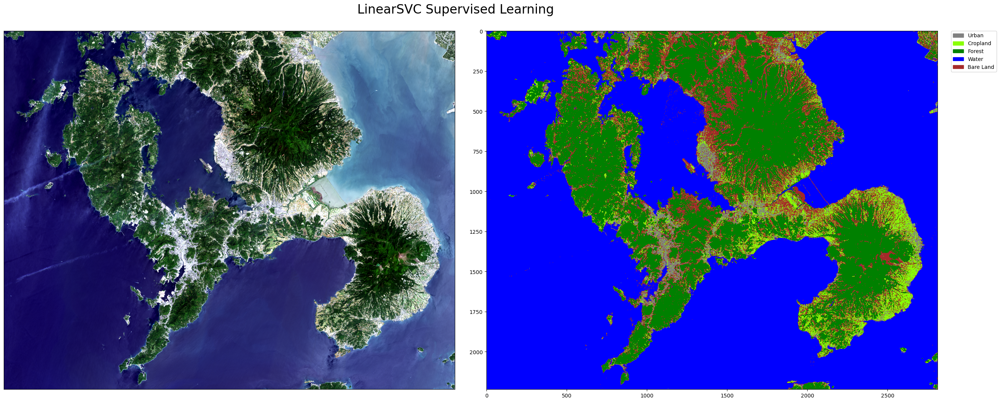

In [68]:
# the results are incredibly good!
fig, ax = plt.subplots(1,2,figsize = (32,18), gridspec_kw={'wspace': 0.07})

colors = ["grey", "xkcd:lime green", "green", "blue", "brown"]
cmap = ListedColormap(colors)

ep.plot_rgb(stack, rgb = (3,2,1), stretch = True, ax = ax[0])
# ax[0].imshow(reshape_as_image(histogram_stretch(stack[[3,2,1]])))
ax[1].imshow(nagasaki_svc_pred_2019, cmap = cmap, interpolation='nearest')
# ax[1].imshow(cl_mask, alpha = 0.9 * cl_mask, cmap = "Greys_r")

fig.suptitle("LinearSVC Supervised Learning", y=.8, fontsize = 24)

patches = [mpatches.Patch(color=colors[i], label = inv_dict[i]) for i in range(len(np.unique(nagasaki_svc_pred_2019))) ]
plt.legend(handles=patches, bbox_to_anchor=(1.03, 1), loc=2, borderaxespad=0. )

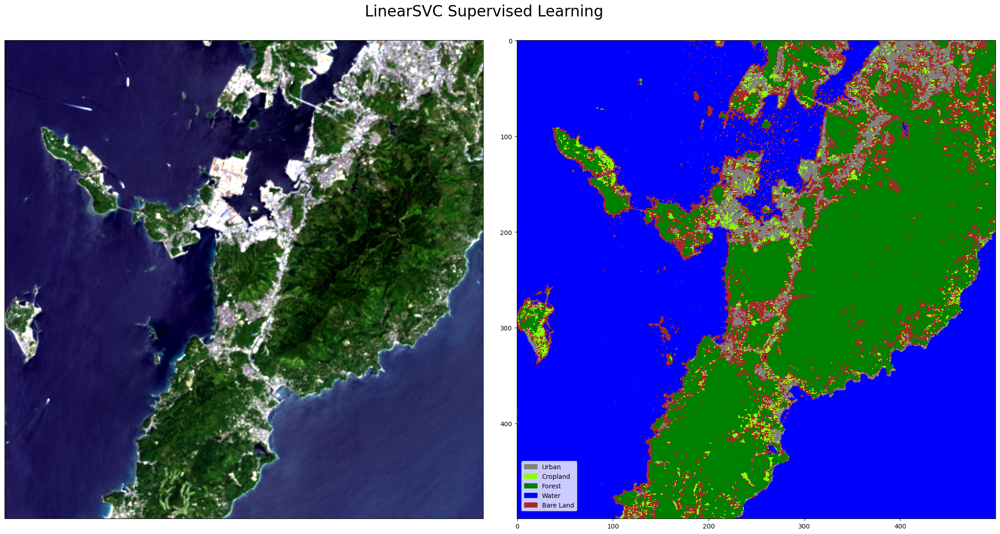

In [53]:
# the linearsvc does slightly worse at identifying beaches than the GNB, but otherwise is much better at distinguishing 
# between urban and bare land
fig, ax = plt.subplots(nrows = 1, ncols = 2,figsize = (28,18), gridspec_kw={'wspace': 0.07})

colors = ["grey", "xkcd:lime green", "green", "blue", "brown"]
cmap = ListedColormap(colors)

ep.plot_rgb(stack[:, 1500:2000, 750:1250], rgb = (3,2,1), stretch = True, ax = ax[0])
ax[1].imshow(nagasaki_svc_pred_2019[1500:2000, 750:1250], cmap = cmap, interpolation='nearest')
# ax[1].imshow(cl_mask[1500:2000, 750:1250], alpha = 0.5 * cl_mask, cmap = "Greys")

fig.suptitle('LinearSVC Supervised Learning', y=.83, fontsize = 24)

patches = [mpatches.Patch(color=colors[i], label = inv_dict[i]) for i in range(len(np.unique(nagasaki_svc_pred_2019))) ]
plt.legend(handles=patches, bbox_to_anchor=(.01, .12), loc=2, borderaxespad=0. )

In [54]:
nagasaki_svc_pred

array([[3, 3, 3, ..., 1, 4, 4],
       [3, 3, 3, ..., 1, 1, 1],
       [3, 3, 3, ..., 2, 2, 4],
       ...,
       [3, 3, 3, ..., 4, 3, 3],
       [3, 3, 3, ..., 3, 4, 4],
       [3, 3, 3, ..., 3, 4, 4]])

In [55]:
nagasaki_svc_pred_2019

array([[3, 3, 3, ..., 1, 4, 4],
       [3, 3, 3, ..., 1, 1, 1],
       [3, 3, 3, ..., 2, 2, 4],
       ...,
       [3, 3, 3, ..., 4, 3, 3],
       [3, 3, 3, ..., 3, 4, 4],
       [3, 3, 3, ..., 3, 4, 4]])

In [56]:
change = np.zeros(nagasaki_svc_pred.shape)

In [74]:
forest_2019 = nagasaki_svc_pred_2019 == 2
forest_2023 = nagasaki_svc_pred == 2

non_forest_2019 = nagasaki_svc_pred_2019 != 2
non_forest_2023 = nagasaki_svc_pred != 2

# Forest expansion
change = np.where((non_forest_2019 & forest_2023), 1, change)

# Forest detraction
change = np.where((forest_2019 & non_forest_2023), -1, change)

# lulc_dict = dict((
#     ("Urban", 0),
#     ("Cropland", 1),
#     ("Forest", 2),
#     ("Water", 3),
#     ("Bare Land", 4),
# ))

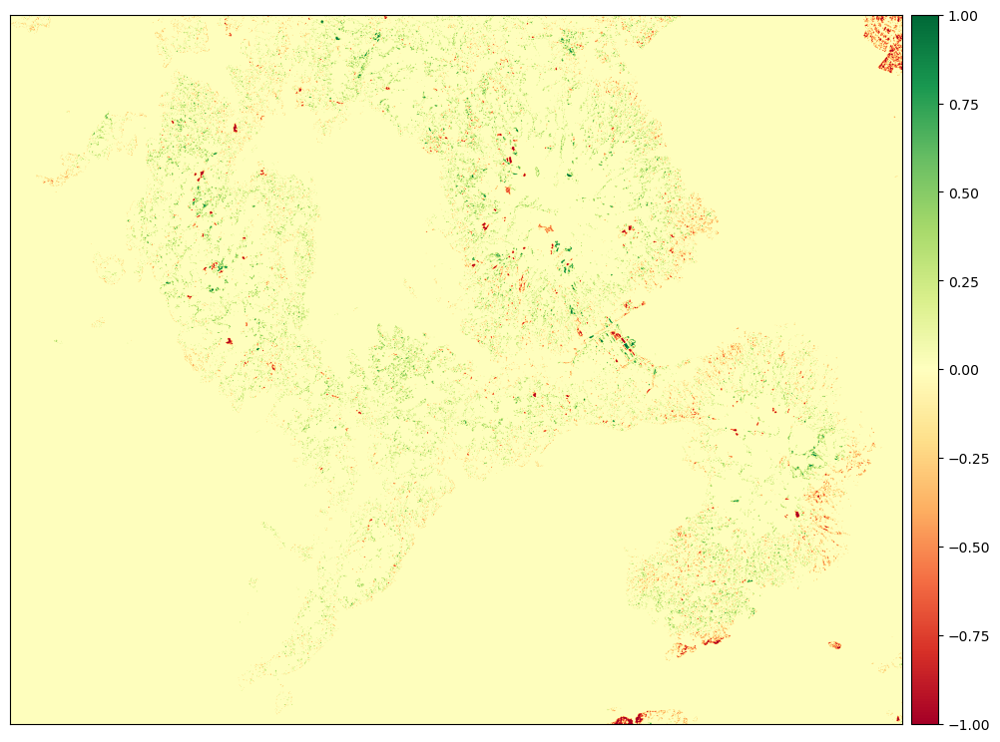

<Axes: >

In [80]:
ep.plot_bands(change, cmap = "RdYlGn")

In [73]:
profile.update(dtype = np.int8, nodata = 255, count = 1)

with rio.open(
    "outputs/svc_classified.tif",
    "w",
    **profile
) as dst:
    dst.write(change[np.newaxis, ...].astype(np.int8))
    dst.close()

array([False,  True])